# Imports

Import custom files.

In [1]:
import general_functions as gf
import distribution_center as dc
import radial_comparison as rc
import area_comparison as ac

Import other modules.

In [2]:
from ultralytics import YOLO
from matplotlib import pyplot as plt
import glob
import numpy as np
import shapely
import multiprocessing
import cv2

# Setup

Image_path is the path to the images of type image_type.  
The image type specifies which type of image you want to read. It must be compatible with cv2 imread.  
**note:** converting the image to another type could slightly change the result.
  
Reference_path is the path to your reference mask txt files. The name of the txt files for one image must include the name of the image.  
All masks in that folder will be used to create the mean mask. 
  
In compare_path are the masks you want to compare with the mean masks. They need to include the image name too.  
You need to have at least one txt file (mask) per image and path, otherwise you might get errors.  
Results will be saved at savepath.

In [3]:
image_path = '../test_images/rcf'
image_type = '.jpg'

reference_path = '../outputs/UserLabels/rcf'

compare_paths = ['../outputs/pyRES/', '../outputs/yolov8seg/rcf']
savepath = '../outputs/evaluation/rcf'

Number of angles for the radial intersection point calculation.  
angle_steps = 720 means 0.5 degree steps.

In [4]:
angle_steps = 720

Point size and linewidth for plots with pyplot.

In [5]:
point_size = 100
linewidth = 4

Number of processor cores for parallel evaluations.

In [6]:
processor_cores=20

# Center calculation

Read images.

In [7]:
image_paths = glob.glob(image_path + '/*' + image_type)
image_paths.sort()
images = [cv2.imread(path) for path in image_paths]

Calculate the centers with a 2D gaussian function.  
This option allows to get a mask independen center point.
That point will be used for mask comparisions.  
**note:** This could take some time. Use multiprocessing to speed it up.

In [8]:
pool = multiprocessing.Pool(processes=processor_cores)
args = [(sum, 2, image) for image in images]
sum_grayscales = pool.starmap(np.apply_along_axis, args)

In [9]:
pool = multiprocessing.Pool(processes=processor_cores)
args = [([img], [['gauss', [0.5, 0.02, False, True]]]) for img in sum_grayscales]
centers = pool.starmap(dc.get_centers, args)

In [10]:
centers

[[(1095.0916827967856, 548.5403630921704)],
 [(1243.3299479768016, 1150.3798058459713)],
 [(1007.2297298239012, 1039.0825762684638)],
 [(1145.4611483388546, 1034.881498558538)],
 [(1272.584515476571, 682.6025915196736)]]

# Radial Intersection Points

Read masks from YOLO .txt files.  
The masks will be read to seperated lists, one list per image.  
The masks that are averaged and the masks that should be compared are read to different lists.  
**note:**  
Here we only read one mask per file.  
If you have multiple masks in one txt, decide for one.  
The read function could read multi-mask txt files, but for the comparison, it is necessary to have one mask per txt.

In [11]:
all_masks = []
all_compare_masks = []
for img_path in image_paths:
    name = img_path.replace('\\', '/').split('/')[-1].split('.')[-2]    
    masks_paths = glob.glob(reference_path + '/*' + name + '[_-]*' + '.txt') 
    masks_paths.sort()
    compare_masks_paths = []
    for path in compare_paths:
        compare_masks_paths.extend(glob.glob(path + '/*' + name + '[_-]*' + '.txt'))
    compare_masks_paths.sort()
    all_compare_masks.append(gf.read_masks_from_txt(compare_masks_paths)[1])
    all_masks.append(gf.read_masks_from_txt(masks_paths)[1])

Get shapley polygons from the masks.

In [12]:
polygons = [gf.polygons_from_coordinates([mask[0] if mask != [] else mask for mask in masks])[0] for masks in all_masks]
compare_polygons = [gf.polygons_from_coordinates([mask[0] if mask != [] else mask for mask in masks])[0] for masks in all_compare_masks]

Setup angles.

In [13]:
angles = [2*np.pi*(1/angle_steps)*(i) for i in range(0, angle_steps)]

Calculate all radii with polygon-line intersections.  
To do that, convert the center points to relative coordinates first.

In [14]:
rel_centers = [(centers[i][0][0]/images[i].shape[1], centers[i][0][1]/images[i].shape[0]) for i in range(0, len(centers))]

In [15]:
all_polygons_intersections = []
all_compare_polygons_intersections = []
for i in range(0, len(polygons)):
    lines = [rc.line_at_angle(rel_centers[i], angle) for angle in angles]
    polygons_intersections = []
    compare_intersections = []
    for polygon in polygons[i]:
        intersections = shapely.intersection(lines, polygon)
        polygons_intersections.append((polygon, intersections))
    for polygon in compare_polygons[i]:
        intersections = shapely.intersection(lines, polygon)
        compare_intersections.append((polygon, intersections))
    all_polygons_intersections.append(polygons_intersections)
    all_compare_polygons_intersections.append(compare_intersections)

In [16]:
all_radii = []
all_compare_radii = []
for i in range(0, len(all_polygons_intersections)):
    all_radii.append(rc.intersection_radii(all_polygons_intersections[i], rel_centers[i]))
    all_compare_radii.append(rc.intersection_radii(all_compare_polygons_intersections[i], rel_centers[i]))

# Radial Comparision of one mask with a mean mask

Get mean and standard deviation from radii with mean_radii_at_angle. Do that for all masks and all angles in one mask.  
**note:**  
You might get Warnings for empty slices in combination with invalid value in scaler divide.  
This could happen if there are masks that do not have intersection points, but the function should still work.

In [17]:
all_mean_mask_points = []
for radii in all_radii:
    mean_mask_points = []
    for a in range(0, len(angles)):
        mean_mask_points.append(rc.mean_radii_at_angle([mask_radii[a] for mask_radii in radii]))
    all_mean_mask_points.append(mean_mask_points)

/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/lib/python3/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Construct the uncertainty band.

In [18]:
bands = []
for mean_mask in all_mean_mask_points:
    bands.append(rc.mean_mask_uncertainty(mean_mask))

Plot the results with plot_coordinates_of_nth_intersections and cartesian_coordiantes to get them in cartesian coordinates.

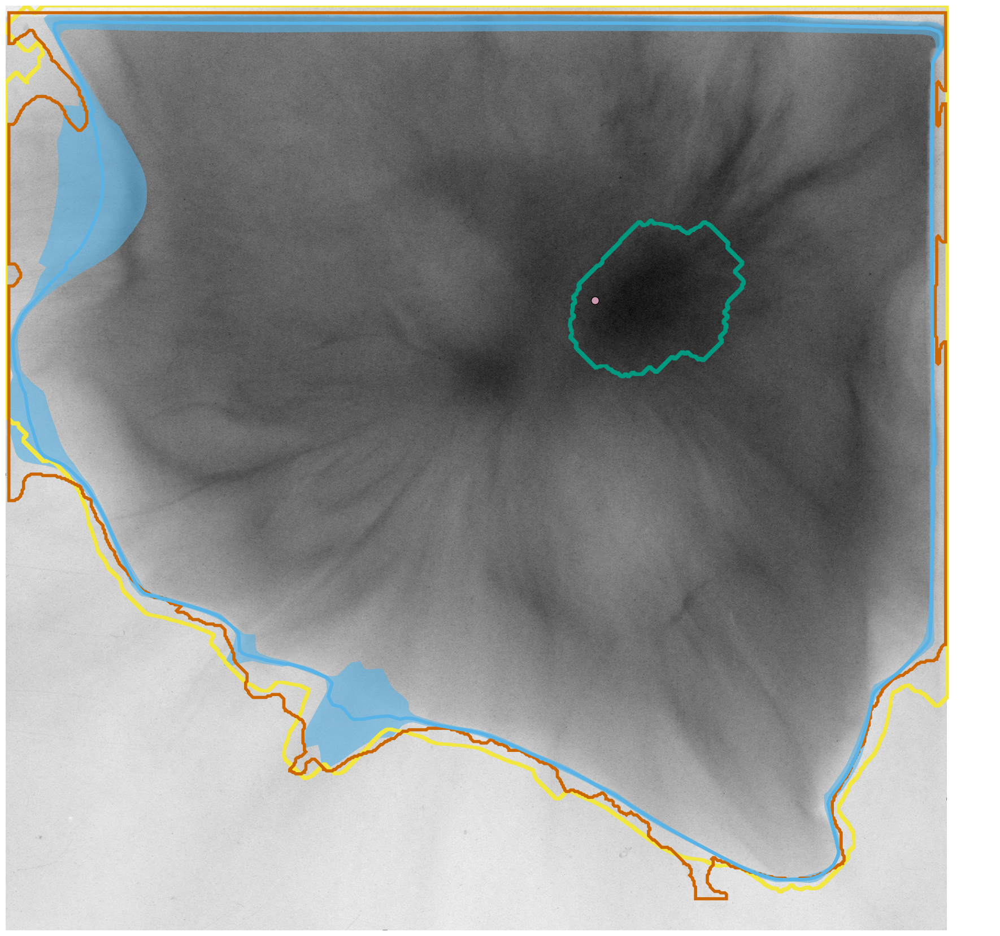

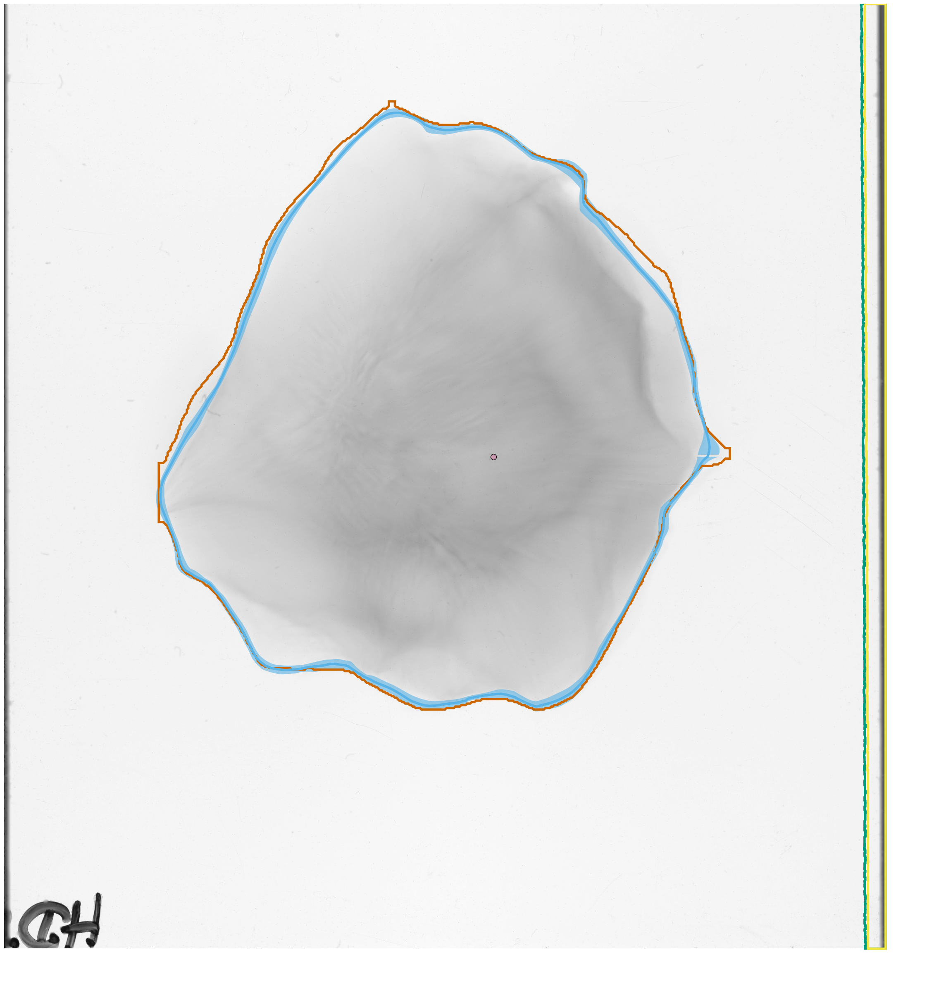

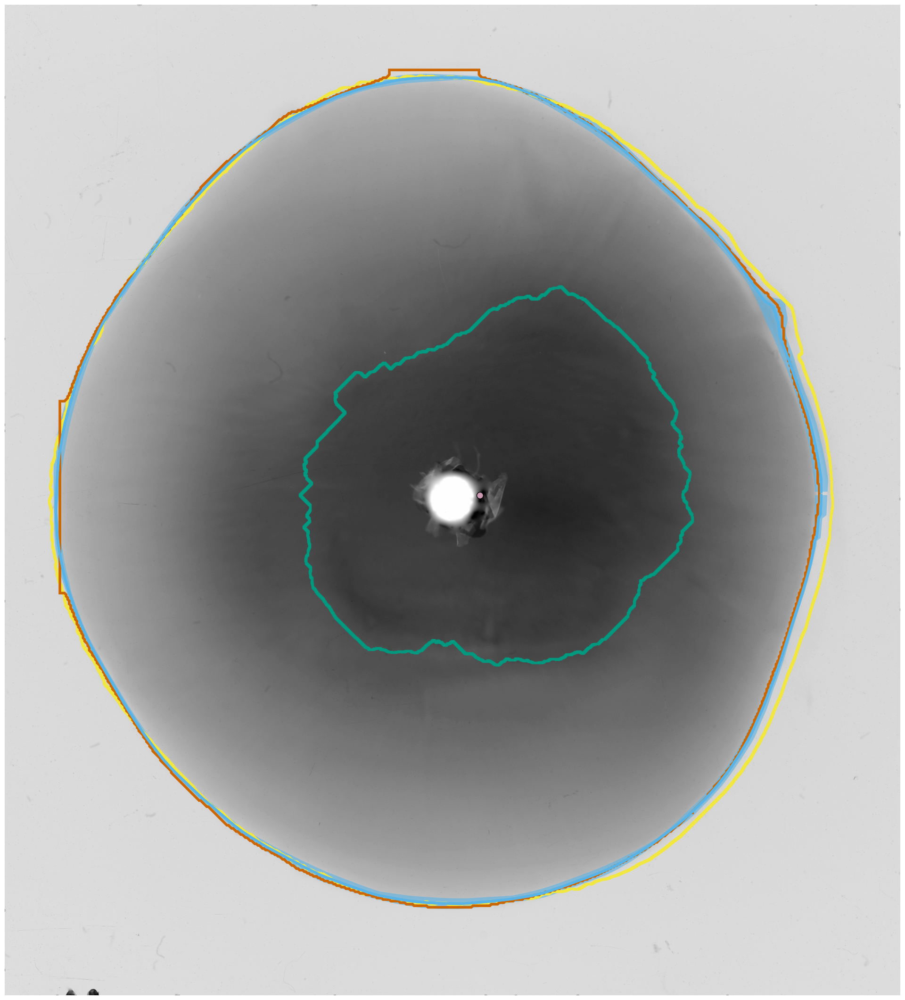

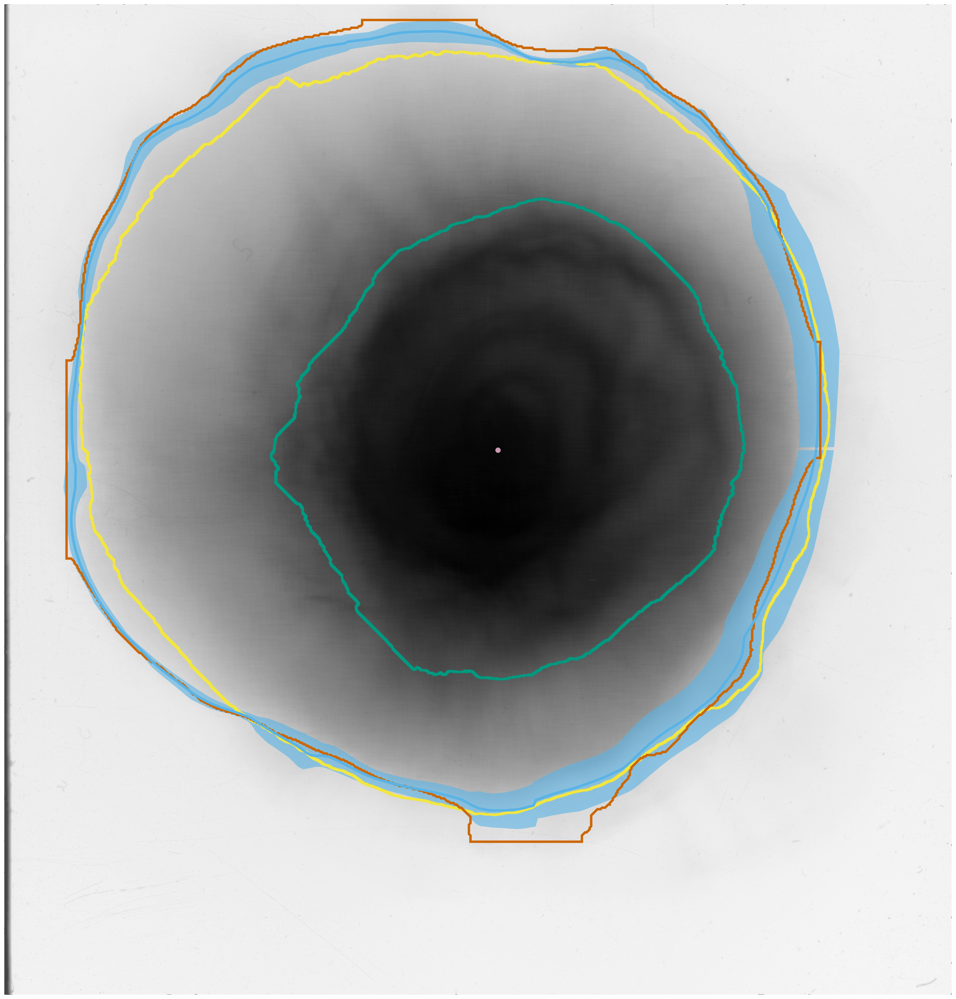

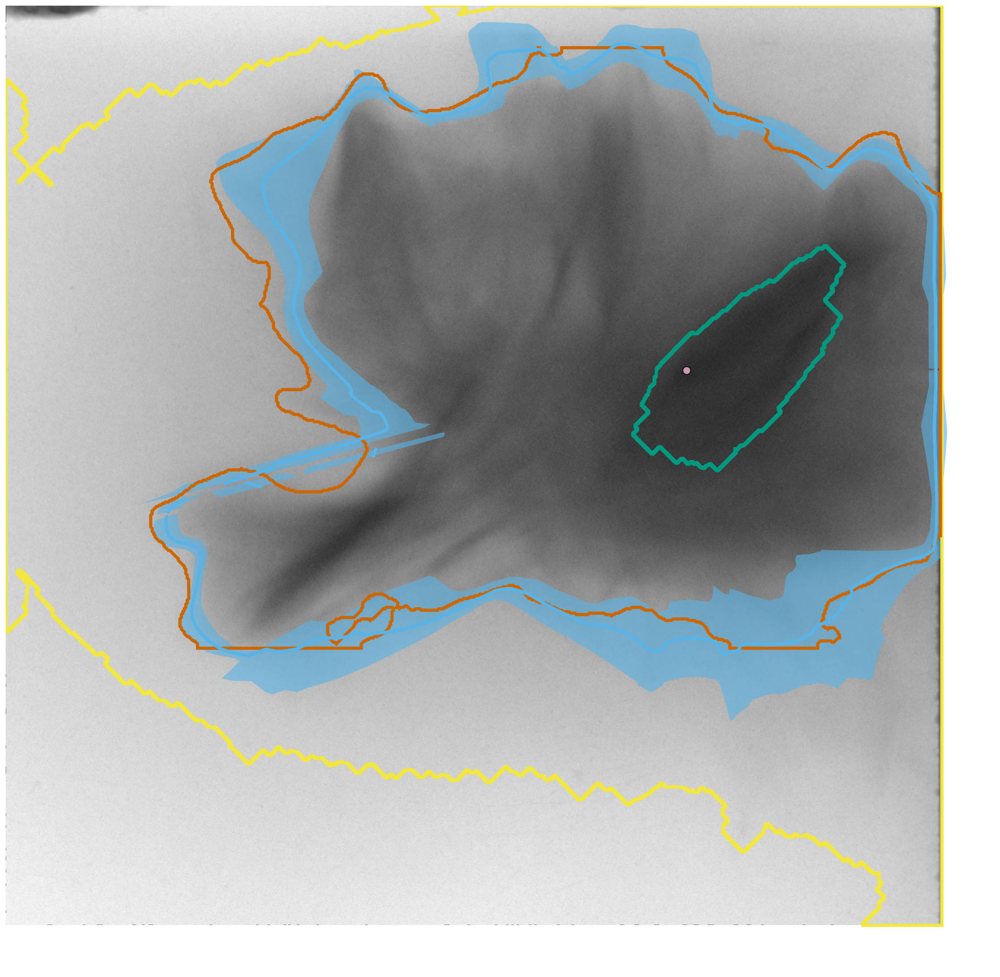

In [19]:
for i in range(0,len(image_paths)):
    name = image_paths[i].replace('\\', '/').split('/')[-1].split('.')[-2]
    
    #Set the plot size according to the image size
    fig, ax = plt.subplots(figsize=(images[i].shape[1] / 100, images[i].shape[0] / 100))
    
    #Show images in gray to improve visibility of the masks
    ax.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2GRAY), cmap='gray')
    
    #Draw the centre point as a red dot
    ax.scatter([centers[i][0][0]], [centers[i][0][1]], color=[0.8, 0.6, 0.7], edgecolor = 'black', s=point_size) 
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_frame_on(False)

    #Calculate the contours.
    o = 0
    ang_parts, ri_min, ra_min = rc.plot_coordinates_of_nth_intersections(0, bands[i][0], angles)
    ang_parts, ri_mean, ra_mean = rc.plot_coordinates_of_nth_intersections(0, bands[i][1], angles)
    ang_parts, ri_max, ra_max = rc.plot_coordinates_of_nth_intersections(0, bands[i][2], angles)
    
    while sum([len(l) for l in ang_parts]) != 0:
        for p in range(0, len(ang_parts)):
            #lower uncertainty bands for both points of one intersection segment
            cartesian_coords_min_i = gf.cartesian_coordiantes((ang_parts[p] + ang_parts[p][::-1],
                                                               ri_min[p] + ri_mean[p][::-1]),
                                                              center = rel_centers[i], size = images[i].shape[1::-1])
            cartesian_coords_min_a = gf.cartesian_coordiantes((ang_parts[p] + ang_parts[p][::-1],
                                                               ra_min[p] + ra_mean[p][::-1]),
                                                              center = rel_centers[i], size = images[i].shape[1::-1])
            ax.fill(cartesian_coords_min_i[0], cartesian_coords_min_i[1], c = [0.35,0.7,0.9,0.6], linewidth = 0)
            ax.fill(cartesian_coords_min_a[0], cartesian_coords_min_a[1], c = [0.35,0.7,0.9,0.6], linewidth = 0)

            #upper uncertainty bands for both points of one intersection segment
            cartesian_coords_max_i = gf.cartesian_coordiantes((ang_parts[p] + ang_parts[p][::-1],
                                                               ri_max[p] + ri_mean[p][::-1]),
                                                              center = rel_centers[i], size = images[i].shape[1::-1])
            cartesian_coords_max_a = gf.cartesian_coordiantes((ang_parts[p] + ang_parts[p][::-1],
                                                               ra_max[p] + ra_mean[p][::-1]),
                                                              center = rel_centers[i], size = images[i].shape[1::-1])
            ax.fill(cartesian_coords_max_i[0], cartesian_coords_max_i[1], c = [0.35,0.7,0.9,0.6], linewidth = 0)
            ax.fill(cartesian_coords_max_a[0], cartesian_coords_max_a[1], c = [0.35,0.7,0.9,0.6], linewidth = 0)

            #mean masks for both points of one intersection segment
            cartesian_coords_mean_i = gf.cartesian_coordiantes((ang_parts[p], ri_mean[p]),
                                                               center = rel_centers[i], size = images[i].shape[1::-1])
            cartesian_coords_mean_a = gf.cartesian_coordiantes((ang_parts[p], ra_mean[p]),
                                                               center = rel_centers[i], size = images[i].shape[1::-1])
            ax.plot(cartesian_coords_mean_i[0], cartesian_coords_mean_i[1], c = [0.35,0.7,0.9], linewidth=linewidth)
            ax.plot(cartesian_coords_mean_a[0], cartesian_coords_mean_a[1], c = [0.35,0.7,0.9], linewidth=linewidth)
            
        o = o + 1
        ang_parts, ri_min, ra_min = rc.plot_coordinates_of_nth_intersections(o, bands[i][0], angles)
        ang_parts, ri_mean, ra_mean = rc.plot_coordinates_of_nth_intersections(o, bands[i][1], angles)
        ang_parts, ri_max, ra_max = rc.plot_coordinates_of_nth_intersections(o, bands[i][2], angles)

    #masks to compare
    colors = [[0, 0.6, 0.5], [0.95,0.9,0.25],[0.8, 0.4, 0]]
    for j in range(0, len(all_compare_masks[i])):
        if len(all_compare_masks[i][j]) != 0:
            ax.fill([point[0]*images[i].shape[1] for point in all_compare_masks[i][j][0]],
                    [point[1]*images[i].shape[0] for point in all_compare_masks[i][j][0]],
                    fill = False, c = colors[j], linewidth=linewidth)

    #save image without white space
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
    #plt.savefig(f"{savepath}/{name}_mean.svg", dpi=100, facecolor='white',transparent=False)
    #close figure if the images should not be shown
    #plt.close(fig)

# Mean mask to polygon

Save the mean contour in a black image and then load it as an array and save it as polygons in a list

In [20]:
mean_masks_polygon=[]
#use different arguments for images for better results
args = [(0,0), (0,0), (0,0), (0,0), (15,5)]

for i in range(len(image_paths)):
    
    name = image_paths[i].replace('\\', '/').split('/')[-1].split('.')[-2]
    black_img = np.zeros_like(images[i])
    
    #Set the plot size according to the image size
    plt.rcParams["figure.figsize"] = (images[i].shape[1] / 100, images[i].shape[0] / 100)
    fig, ax = plt.subplots()
    ax.imshow(black_img, cmap='gray')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_frame_on(False)
    
    o = 0
    ang_parts, ri_mean, ra_mean = rc.plot_coordinates_of_nth_intersections(0, bands[i][1], angles)

    while sum([len(l) for l in ang_parts]) != 0:
        for p in range(len(ang_parts)):
            cartesian_coords_mean_i = gf.cartesian_coordiantes((ang_parts[p], ri_mean[p]),
                                                               center = rel_centers[i], size = images[i].shape[1::-1])
            cartesian_coords_mean_a = gf.cartesian_coordiantes((ang_parts[p], ra_mean[p]),
                                                               center = rel_centers[i], size = images[i].shape[1::-1])
            ax.plot(cartesian_coords_mean_i[0], cartesian_coords_mean_i[1], c = [0,0,1], linewidth=linewidth)
            ax.plot(cartesian_coords_mean_a[0], cartesian_coords_mean_a[1], c = [0,0,1], linewidth=linewidth)

        o += 1
        ang_parts, ri_mean, ra_mean = rc.plot_coordinates_of_nth_intersections(o, bands[i][1], angles)

    #save image without white space
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0) 
    plt.savefig(f"{savepath}/{name}_mean_black.png", dpi=100, facecolor='white', transparent=False)
    plt.close()

    contour_img=cv2.imread(f"{savepath}/{name}_mean_black.png",cv2.IMREAD_GRAYSCALE)
    mean_contour_polygon= ac.img_contour_to_polygon(contour_img, *args[i])
    mean_masks_polygon.append(mean_contour_polygon)

Save the mean masks to YOLO txt files.

In [21]:
for i in range(len(mean_masks_polygon)):
    points = mean_masks_polygon[i].exterior.coords
    contour_line = '0'
    for point in points:
        contour_line = contour_line + ' ' + str(point[0]) + ' ' + str(point[1])
    with open(savepath + '/' + image_paths[i].replace('\\', '/').split('/')[-1].split('.')[-2] + '_mean_contour.txt', "w") as f:
        f.write(contour_line)

# Polar Comparison of masks

The deviation of two masks can be calculated from radii with rc.intersection_deviation. The results are plotted in a polar diagram.

/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/lib/python3/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


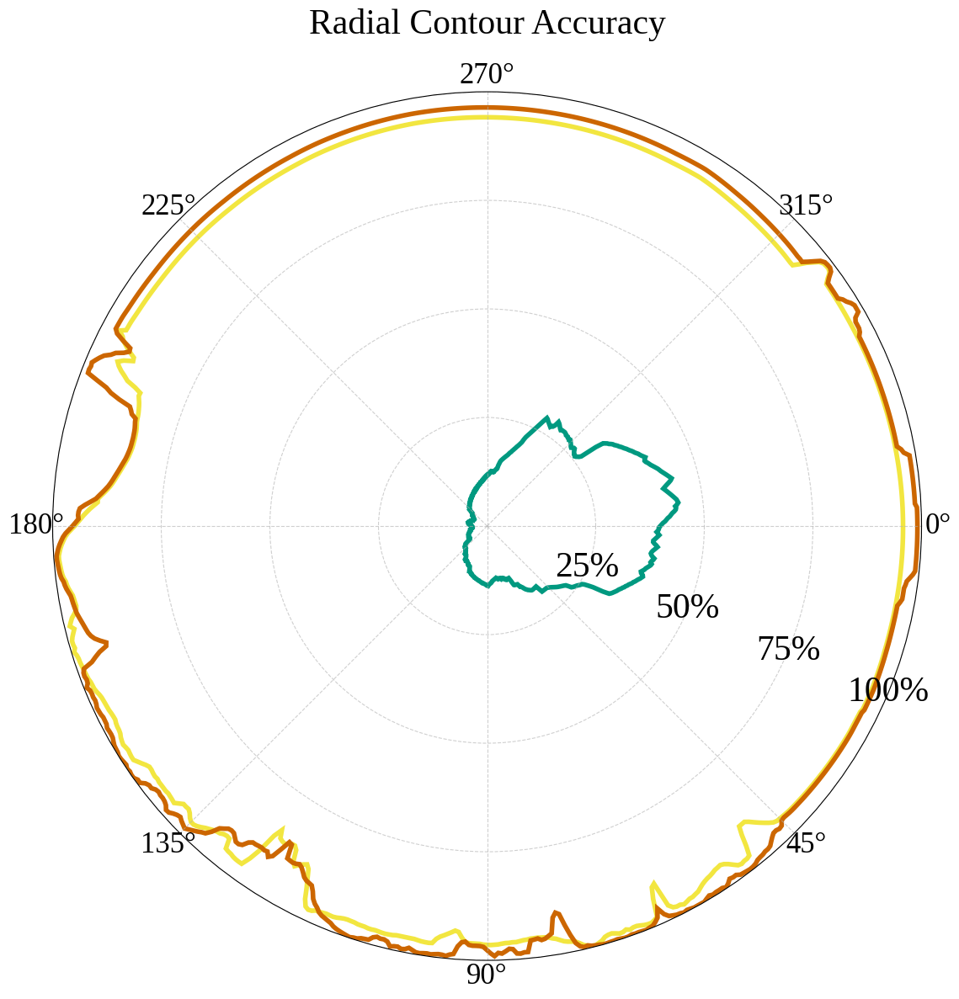

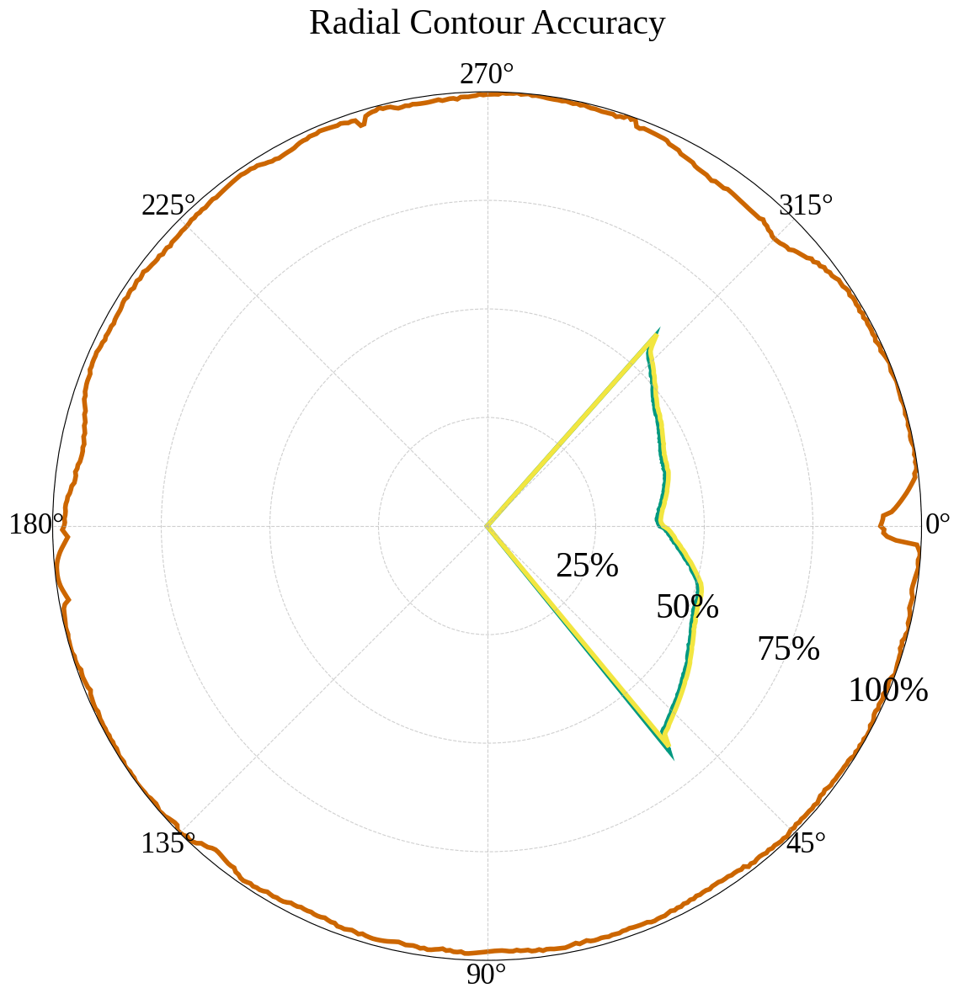

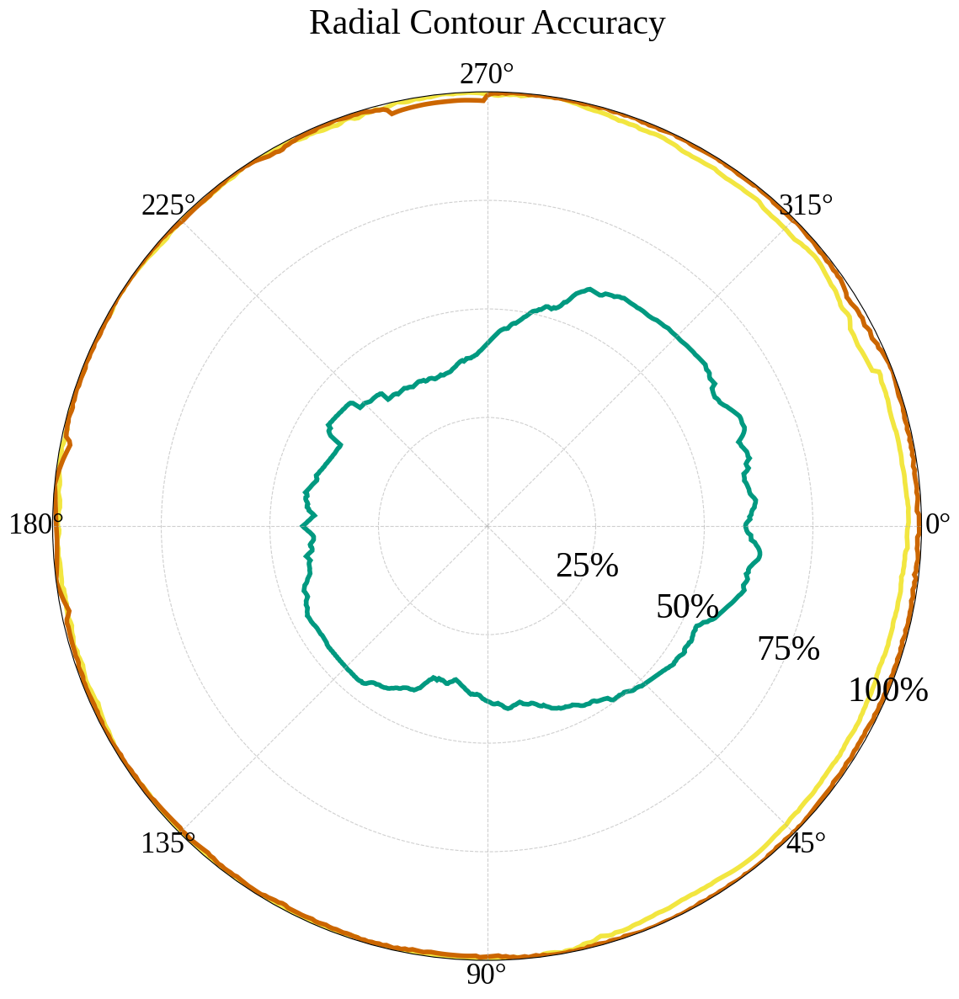

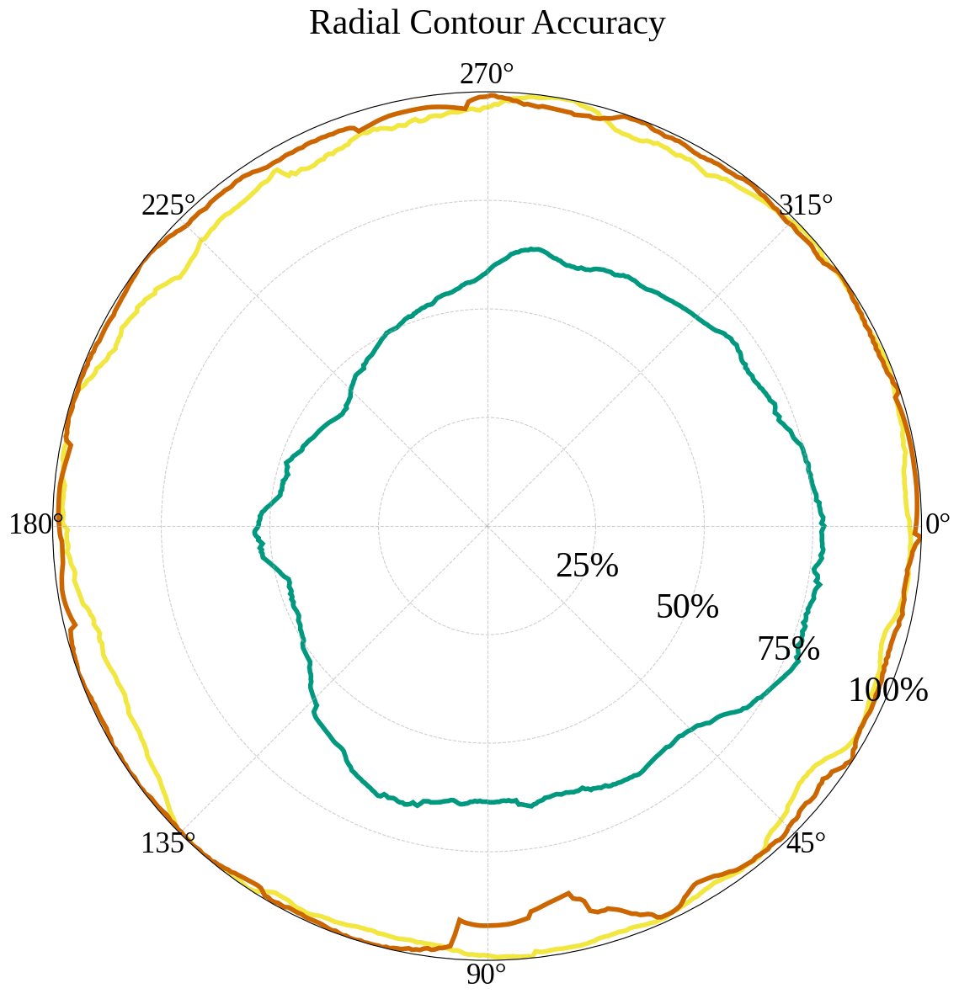

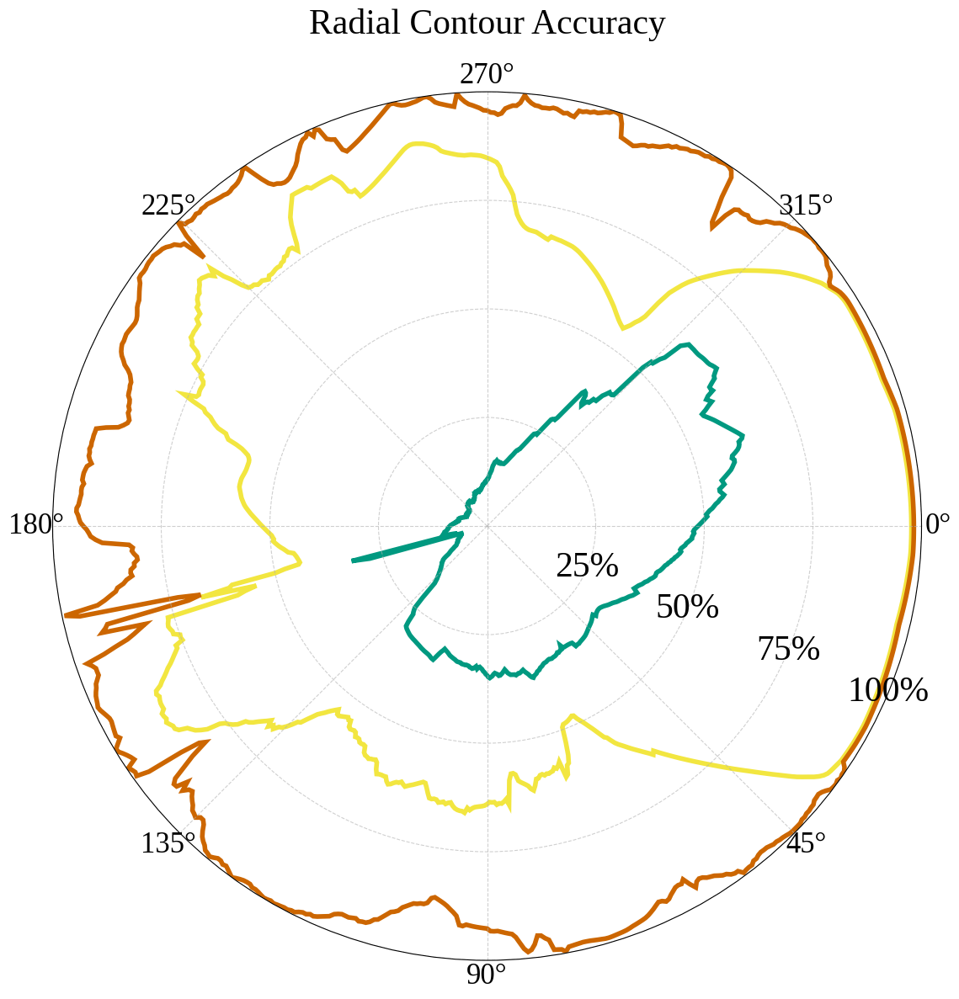

In [22]:
for i in range(0, len(all_compare_radii)):
    name = image_paths[i].replace('\\', '/').split('/')[-1].split('.')[-2]
    mean_mask_radii = []
    for part in bands[i][1]:
        mean_mask_radii.extend(part)
    plt.rcParams["figure.figsize"] = (12, 12)
    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, facecolor='white')
    colors = [[0, 0.6, 0.5], [0.95,0.9,0.25], [0.8, 0.4, 0]]
    for j in range(0, len(all_compare_radii[i])):
        ax.fill(angles, [rc.intersection_deviation(mean_mask_radii[a], all_compare_radii[i][j][a]) for a in range(len(angles))], fill=False, c=colors[j], linewidth = linewidth)
    ax.set_xticks([0, np.pi/4, np.pi/2, np.pi*3/4, np.pi, np.pi*5/4, np.pi*3/2, np.pi*7/4])
    ax.set_xticklabels(["0°", "45°", "90°", "135°", "180°", "225°", "270°", "315°"],fontsize=25, fontname="Liberation Serif")
    ax.set_rmax(1.0)  # Skala bleibt zwischen 0 und 1 (100%)
    ax.set_rticks([0.25, 0.5, 0.75, 1.0])  # Markierungen für 25%, 50%, 75%, 100%
    ax.set_yticklabels(["25%", "50%", "75%", "100%"], fontsize=30, fontname="Liberation Serif",va="center", ha="center")
    ax.set_theta_direction(-1)
    ax.grid(True,linestyle="--", alpha=0.6)
    plt.title("Radial Contour Accuracy", fontsize=30, fontname="Liberation Serif", pad=50)

    #save figure and close it, if it should not be shown
    plt.subplots_adjust(left=0.01, bottom=0.05, right=0.99, top=0.91, wspace=0.01, hspace=0.01)
    #plt.savefig(f"{savepath}/{name}_polar.svg")
    #plt.close()

Calculate mean deviations for all images.

In [23]:
#pure deviations per image per source per angle
all_deviations = []
#mean deviations over all angles per image per source with their std
mean_deviations = []
mean_deviations_std = []
for i in range(0, len(all_radii)):
    #extract image name to find fitting .txt files
    name = image_paths[i].split('/')[-1].split('.')[-2]
    #construct mean mask from bands
    mean_radii = []
    for part in bands[i][1]:
        mean_radii.extend(part)
    #compare all masks in the fitting part of all_compare_radii[i] with the mean mask
    mask_deviation = []
    mask_mean_deviations = []
    mask_mean_deviations_std = []
    for radii in all_compare_radii[i]:
        deviations = [rc.intersection_deviation(mean_radii[a], radii[a]) for a in range(0, len(angles))]
        mask_deviation.append(deviations)
        mask_mean_deviations.append(np.mean(deviations))
        mask_mean_deviations_std.append(np.std(deviations))
    all_deviations.append(mask_deviation)
    mean_deviations.append(mask_mean_deviations)
    mean_deviations_std.append(mask_mean_deviations_std)

/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/lib/python3/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [24]:
mean_deviations

[[0.16661686910782672, 0.9467414564096215, 0.9627692681642366],
 [0.1360515697269547, 0.137137394630138, 0.9825433500023968],
 [0.4783009877323662, 0.9839937780792034, 0.9939307373652043],
 [0.6101962679403561, 0.9668332889432705, 0.9792359902939664],
 [0.2606407698042782, 0.7518962650799558, 0.9583132403705534]]

In [25]:
mean_deviations_std

[[0.12489451573115638, 0.029915188032377235, 0.030507596875512157],
 [0.22209196716518376, 0.22448320724050227, 0.015223472634728712],
 [0.08872465554817026, 0.013509833668449217, 0.004330007529307697],
 [0.10264442310527891, 0.022572836835731268, 0.022592401975381485],
 [0.17495960727910495, 0.15885375671452745, 0.041620561160058196]]

Calculate the mean of all images per source

In [26]:
sorted_deviations = []
for a in range(0, len(all_deviations[0])):
    deviations_per_algo = []
    for i in range(0, len(all_deviations)):
        for w in range(0, len(all_deviations[0][0])):
            deviations_per_algo.append(all_deviations[i][a][w])
    sorted_deviations.append(deviations_per_algo)

In [27]:
np.mean(sorted_deviations[0]), np.mean(sorted_deviations[1]), np.mean(sorted_deviations[2])

(0.3303612928623564, 0.7573204366284378, 0.9753585172392716)

In [28]:
np.std(sorted_deviations[0]), np.std(sorted_deviations[1]), np.std(sorted_deviations[2])

(0.238145128424381, 0.34439145818751743, 0.029272918969630995)